Agustina Disiot - 221025
Ivan Monjardin - 239850

# Arboles de decision y EDA
La clase pasada estuvimos viendo un poco de estadistica y EDA (exploratory data analysis), en este practico vamos a utilizar una herramienta que nos presenta la misma informacion de una forma mas amigable, y que requiere menos codigo

La primer mitad vamos a trabajar con el dataset de flores iris, y la segunda mitad es para que ustedes trabajen con el dataset breast-cancer-wisconsin.data

## Iris

Iris es un dataset clásico para quellos incursionando en el campo de Machine Learning, se trata de una coleccion de 150 flores que deben ser categorizadas en 3 clases (Setosa, Versicolor, Virginica). Esto debe realizarse a partir de medidas tomadas sobre cada flor.


Abajo comenzamos explorando el dataset y dejamos algunas tareas para que ustedes completen a medida que van avanzando. 



In [ ]:
# google colab
!pip install matplotlib scikit-learn pandas
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
#reseter kernel. van a Runtime > Restart Runtime

# local
# !pip install matplotlib scikit-learn pandas pandas-profiling


  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris

iris_dataset = load_iris()
iris_dataset.keys()


dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [ ]:
iris_dataset['target_names']

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [ ]:
iris_dataset['feature_names']

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

### Explorar el dataset
Para ello vamos a utilizar esta nueva herramienta que mencionamos, se llama `pandas-profiling`. Es parecido a `pandas.describe()` que vimos la clase pasada, pero nos da todavia mas informacion, y nos lo presenta de una manera mas linda.

Lo primero que vamos a tener que hacer es cargar el dataset en un dataframe

In [ ]:
#cargamos data al dataframe
df=pd.DataFrame(iris_dataset['data'], columns=iris_dataset['feature_names'])
#le agregamos el target
df['target'] = iris_dataset['target']

In [ ]:
df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


In [ ]:
df.describe()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
count,150.000000,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333,1.000000
std,0.828066,0.435866,1.765298,0.762238,0.819232
min,4.300000,2.000000,1.000000,0.100000,0.000000
25%,5.100000,2.800000,1.600000,0.300000,0.000000
50%,5.800000,3.000000,4.350000,1.300000,1.000000
75%,6.400000,3.300000,5.100000,1.800000,2.000000
max,7.900000,4.400000,6.900000,2.500000,2.000000


In [ ]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df)

profile

Summarize dataset:   0%|          | 0/18 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Si queremos podemos guardar el reporte como html

In [ ]:
profile.to_file("iris_dataset.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Plotting some features

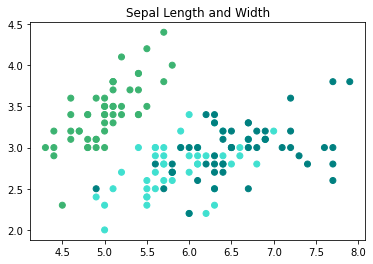

In [ ]:
colors = np.array(["mediumseagreen", "turquoise", "teal"])
plt.scatter(df['sepal length (cm)'], df['sepal width (cm)'], color=colors[df['target']])
plt.title("Sepal Length and Width")
plt.show()

## Ejercicio 1
Grafique el largo y ancho de los petalos 

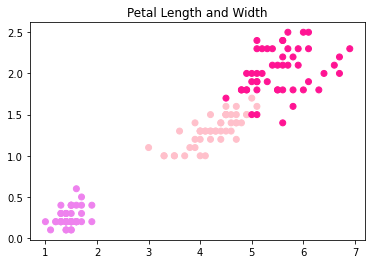

In [ ]:
colors = np.array(["violet", "pink", "deeppink"])
plt.scatter(df['petal length (cm)'], df['petal width (cm)'], color=colors[df['target']])
plt.title("Petal Length and Width")
plt.show()

TAREA 2
Qué puede observar en ambas graficas respecto a las tres clases? Qué conclusiones puede tomar?



Existe una relación mas directa entre el length y el width de los petalos (a mayor length mayor width) en la segunda grafica mientras que en el caso de sepal no se ve una relacion evidente.
Si observamos la matriz de correlacion en el pandas verificamos que hay poca correlacion entre sepal width y sepal length (color beige, cercano a 0) y una alta correlacion entre petal width y petal length (azul oscuro, cercano a 1)


Con respecto a las clases, en el caso de los petalos se pueden observar claramente agrupadas las distintas clases dependiendo del tamaño.
En el primer caso no se puede distingir tan claramente pero mas o menos se puede ver que la clase 'setosa' tiene una relacion y valores de width y length más diferente a las otras dos clases. Las otras dos clases no son tan facil de distinguir entre una y la otra solo conociendo el width y length de los sepals.

# Clasificación

Para este problema de ejemplo vamos a entrenar un modelo sencillo basado en [Árboles de Decisión](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html).

Los árboles de decision son algoritmos de Machine Learning supervisado. Se construye un arbol binario (cada nodo tiene dos ramas). Los valores objetivos se presentan en las hojas de los arboles.

Pero antes de poder llegar a eso debemos dividir el dataset en conjuntos adecuados para **entrenar** y **testar** el modelo.


## Ejercicio 2
Por que debemos separar el set de datos? Es decir, por que no podemos validar el resultado con los mismos datos con los que entrenamos?

El objetivo de conseguir un modelo de machine learning (en este caso un arbol) es que lo podamos usar para estimar los resultados de datos que todavia no conocemos. El test set, nos permite estimar que tan bueno es nuestro modelo (por ejemplo, calculando la accurancy) en datos que no conoce o de la "realidad". Por no conocer nos referimos a datos que no fueron usados para crear o entrenar el modelo.  

Si usamos el mismo set de datos para todo, estariamos determinando que tan bueno es un modelo estimando lo datos que ya conoce. Un modelo que tenga mucho overfitting igual podria ser condsiderado bueno, aunque no de buenos resultados con nuevos datos. 

## Split train-test

Usando sklearn separe el dataset (y los targets) iniciales en dos: un set de entremaniento y uno de test.


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(
    df.drop('target', axis=1),
    df['target'],
    test_size=(1.0/3), random_state=42)

print(f'df shape = {df.shape}')
print(f'X_train shape = {X_train.shape}\n{X_train.head()}\n------------------------')
print(f'Y_train shape = {Y_train.shape}\n{Y_train.head()}\n------------------------')
print(f'X_test shape = {X_test.shape}\n{X_test.head()}\n------------------------')
print(f'Y_test shape = {Y_test.shape}\n{Y_test.head()}')

df shape = (150, 5)
X_train shape = (100, 4)
     sepal length (cm)  sepal width (cm)  petal length (cm)  petal width (cm)
96                 5.7               2.9                4.2               1.3
105                7.6               3.0                6.6               2.1
66                 5.6               3.0                4.5               1.5
0                  5.1               3.5                1.4               0.2
122                7.7               2.8                6.7               2.0
------------------------
Y_train shape = (100,)
96     1
105    2
66     1
0      0
122    2
Name: target, dtype: int64
------------------------
X_test shape = (50, 4)
     sepal length (cm)  sepal width (cm)  petal length (cm)  petal width (cm)
73                 6.1               2.8                4.7               1.2
18                 5.7               3.8                1.7               0.3
118                7.7               2.6                6.9               2.3
78     

Una vez separados los datos podemos crear un modelo y entrenarlo, para ello necesitamos un objeto de la clase `DecisionTreeClassifier`.

Una vez creado llamamos al método `fit` con los datos de entrenamiento para entrenarlo y luego podemos usar los métodos predict para obtener predicciones de las clases para los datos de test.


### Ejercicio 3

Entrene un árbol de decisión de profundidad máxima 3 para clasificar los datos

Recuerden que pueden acceder a la documentacion [aqui](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)


In [ ]:
from sklearn.tree import DecisionTreeClassifier


arbol = DecisionTreeClassifier(criterion='gini', max_depth=3, random_state=42)


In [ ]:
arbol.fit(X_train, Y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

Plotting the Decision Tree

[Text(313.875, 475.65000000000003, 'petal length (cm) <= 2.45\ngini = 0.666\nsamples = 100\nvalue = [31, 35, 34]\nclass = versicolor'),
 Text(209.25, 339.75, 'gini = 0.0\nsamples = 31\nvalue = [31, 0, 0]\nclass = setosa'),
 Text(418.5, 339.75, 'petal width (cm) <= 1.75\ngini = 0.5\nsamples = 69\nvalue = [0, 35, 34]\nclass = versicolor'),
 Text(209.25, 203.85000000000002, 'petal length (cm) <= 5.35\ngini = 0.188\nsamples = 38\nvalue = [0, 34, 4]\nclass = versicolor'),
 Text(104.625, 67.94999999999999, 'gini = 0.105\nsamples = 36\nvalue = [0, 34, 2]\nclass = versicolor'),
 Text(313.875, 67.94999999999999, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 2]\nclass = virginica'),
 Text(627.75, 203.85000000000002, 'petal length (cm) <= 4.85\ngini = 0.062\nsamples = 31\nvalue = [0, 1, 30]\nclass = virginica'),
 Text(523.125, 67.94999999999999, 'gini = 0.444\nsamples = 3\nvalue = [0, 1, 2]\nclass = virginica'),
 Text(732.375, 67.94999999999999, 'gini = 0.0\nsamples = 28\nvalue = [0, 0, 28]\nclass = v

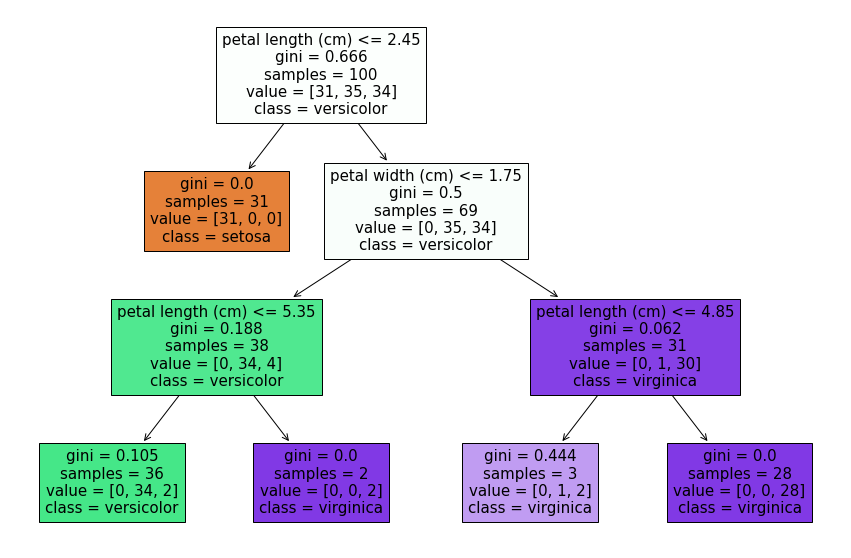

In [ ]:
from sklearn import tree
fig = plt.figure(figsize=(15,10))
tree.plot_tree(arbol, 
                   feature_names=iris_dataset.feature_names,  
                   class_names=iris_dataset.target_names,
                   filled=True)

In [ ]:
fig.savefig("decistion_tree.png")


### Ejercicio 4
Hacer una funcion que mida la accuracy de su modelo, luego compare el resultado con lo mismo calculado por sklearn 

Accuracy: que porcentaje de los datos de test fueron clasificados correctamente?
es 1- error

In [ ]:
# Técnica A
def calculate_accuracy(un_arbol, X_test, Y_test):
  from sklearn.metrics import accuracy_score
  Y_prediction = un_arbol.predict(X_test)
  return accuracy_score(Y_prediction, Y_test)

print("Técnica A:", calculate_accuracy(arbol, X_test, Y_test))

#Técnica B
from sklearn.metrics import accuracy_score
Y_pred = arbol.predict(X_test)
print("Técnica B:", accuracy_score(Y_pred, Y_test))

Técnica A: 0.98
Técnica B: 0.98


### Ejercicio 5

Armar un arbol de altura maxima 2, cual de los dos es mejor?

In [ ]:
arbol2 = DecisionTreeClassifier(criterion='gini', max_depth=2, random_state=42)


In [ ]:
arbol2.fit(X_train, Y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=2, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

[Text(334.8, 453.0, 'petal length (cm) <= 2.45\ngini = 0.666\nsamples = 100\nvalue = [31, 35, 34]\nclass = versicolor'),
 Text(167.4, 271.8, 'gini = 0.0\nsamples = 31\nvalue = [31, 0, 0]\nclass = setosa'),
 Text(502.20000000000005, 271.8, 'petal width (cm) <= 1.75\ngini = 0.5\nsamples = 69\nvalue = [0, 35, 34]\nclass = versicolor'),
 Text(334.8, 90.59999999999997, 'gini = 0.188\nsamples = 38\nvalue = [0, 34, 4]\nclass = versicolor'),
 Text(669.6, 90.59999999999997, 'gini = 0.062\nsamples = 31\nvalue = [0, 1, 30]\nclass = virginica')]

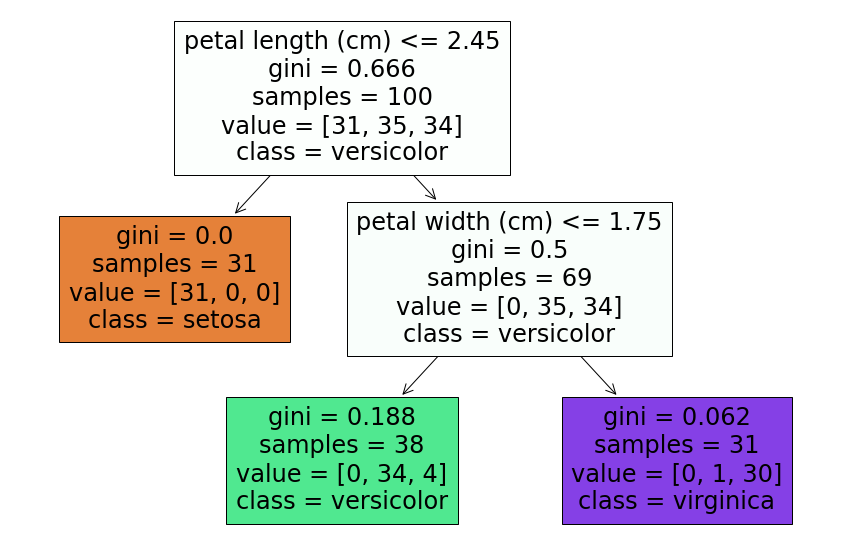

In [ ]:
from sklearn import tree
fig = plt.figure(figsize=(15,10))
tree.plot_tree(arbol2, 
                   feature_names=iris_dataset.feature_names,  
                   class_names=iris_dataset.target_names,
                   filled=True)

In [ ]:
iris_dataset.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [ ]:
iris_dataset.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

Para responder a la pregunta de cual de los dos es mejor compararemos la accuracy

In [ ]:
print("Accuracy arbol 2:", calculate_accuracy(arbol2, X_test, Y_test ))

Accuracy arbol 2: 0.98


vemos que no hay diferencia

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
y_pred1 = arbol.predict(X_test)
y_pred2 = arbol2.predict(X_test)
print("Confusion Matrix Arbol 1")       
print(confusion_matrix(Y_test, y_pred1))
print("Confusion Matrix Arbol 2")       
print(confusion_matrix(Y_test, y_pred2))
print("Classification report Arbol 1")
print(classification_report(Y_test, y_pred1, target_names = iris_dataset["target_names"]))
print("Classification report Arbol 2")
print(classification_report(Y_test, y_pred2, target_names = iris_dataset["target_names"]))

Confusion Matrix Arbol 1
[[19  0  0]
 [ 0 15  0]
 [ 0  1 15]]
Confusion Matrix Arbol 2
[[19  0  0]
 [ 0 15  0]
 [ 0  1 15]]
Classification report Arbol 1
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        19
  versicolor       0.94      1.00      0.97        15
   virginica       1.00      0.94      0.97        16

    accuracy                           0.98        50
   macro avg       0.98      0.98      0.98        50
weighted avg       0.98      0.98      0.98        50

Classification report Arbol 2
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        19
  versicolor       0.94      1.00      0.97        15
   virginica       1.00      0.94      0.97        16

    accuracy                           0.98        50
   macro avg       0.98      0.98      0.98        50
weighted avg       0.98      0.98      0.98        50



Tambien podemos imprimir la matriz de confucion más linda, haciendo un plot

---



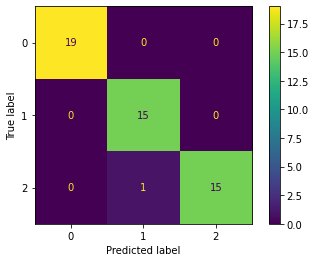

In [ ]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(arbol, X_test, Y_test) 

# Breast Cancer Wisconsin

El dataset de Iris es muy sencillo y muy fácilmente podemos obtener 100% de precisión con un modelo simple. La tarea siguiente implica el uso de un dataset real para el cual van a tener que entrenar un Árbol de decisión para detectar cancer de mama a partir de distintas mediciones. 

La descripción del dataset la pueden encontrar aquí: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Original%29

Carguen el nuevo df

In [ ]:
from google.colab import files

uploaded = files.upload()

Saving breast-cancer-wisconsin.csv to breast-cancer-wisconsin (3).csv


In [ ]:
import io
breast_cancer_df = pd.read_csv(io.BytesIO(uploaded['breast-cancer-wisconsin.csv']), sep=",")

Si hacemos `breast_cancer_df.head()` podemos ver que las columnas no tienen nombre

In [ ]:
breast_cancer_df.head()

,1000025,5,1,1.1,1.2,2,1.3,3,1.4,1.5,2.1
0,1002945,5,4,4,5,7,10,3,2,1,2
1,1015425,3,1,1,1,2,2,3,1,1,2
2,1016277,6,8,8,1,3,4,3,7,1,2
3,1017023,4,1,1,3,2,1,3,1,1,2
4,1017122,8,10,10,8,7,10,9,7,1,4


Le podemos agregar el nombre a las columnas

In [ ]:
breast_cancer_df.columns = ["Id", "clump_thicknes", "cell_size", "cell_shape", "adhesion", "epithelial_cell_size", "nuclei", "chromatin", "nucleoli", "mitoses", "target"]
breast_cancer_df.head()

,Id,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
0,1002945,5,4,4,5,7,10,3,2,1,2
1,1015425,3,1,1,1,2,2,3,1,1,2
2,1016277,6,8,8,1,3,4,3,7,1,2
3,1017023,4,1,1,3,2,1,3,1,1,2
4,1017122,8,10,10,8,7,10,9,7,1,4


In [ ]:
# En el dataset las clases son 2 y 4 que representan Benigno y Maligno, vamos a reemplazarlas por 0 y 1 por simplicidad.
breast_cancer_df["target"].replace(2, 0, inplace=True)
breast_cancer_df["target"].replace(4, 1, inplace=True)

# Opcion A) Eliminamos la columna de ID ya que no nos interesa
breast_cancer_df.drop(columns="Id", inplace=True)

# Opcion B) Hacemos que el ID sea el Index
#breast_cancer_df.set_index("Id", inplace = True)
breast_cancer_df.head()


,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
0,5,4,4,5,7,10,3,2,1,0
1,3,1,1,1,2,2,3,1,1,0
2,6,8,8,1,3,4,3,7,1,0
3,4,1,1,3,2,1,3,1,1,0
4,8,10,10,8,7,10,9,7,1,1


In [ ]:
# Finalmente, contamos cuantos ejemplos son beningnos y cuantos no (0 = B, 1 = M)
breast_cancer_df["target"].value_counts()

0    457
1    241
Name: target, dtype: int64

In [ ]:
breast_cancer_df["nuclei"].value_counts()

1     401
10    132
5      30
2      30
3      28
8      21
4      19
?      16
9       9
7       8
6       4
Name: nuclei, dtype: int64

In [ ]:
breast_cancer_df[breast_cancer_df["nuclei"]=='?']

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
22,8,4,5,1,2,?,7,3,1,1
39,6,6,6,9,6,?,7,8,1,0
138,1,1,1,1,1,?,2,1,1,0
144,1,1,3,1,2,?,2,1,1,0
157,1,1,2,1,3,?,1,1,1,0
163,5,1,1,1,2,?,3,1,1,0
234,3,1,4,1,2,?,3,1,1,0
248,3,1,1,1,2,?,3,1,1,0
274,3,1,3,1,2,?,2,1,1,0
291,8,8,8,1,2,?,6,10,1,1


In [ ]:
#Drop observations which have '?' value in Nuclei quantity
breast_cancer_df.drop(breast_cancer_df[breast_cancer_df["nuclei"]=='?'].index, inplace = True)


### Ejercicio 6

Realice una exploracion del dataset como hicimos para el caso de Iris, tome en cuenta que en este caso tenemos 9 features en lugar de 4.

In [ ]:
from pandas_profiling import ProfileReport

profile = ProfileReport(breast_cancer_df)

profile

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Ejercicio 7

Entrene al menos 2 arboles de Decisión para este set de datos, como hicimos anteriormente, recuerde separar los datos en conjuntos de entrenamiento y test.

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(
    breast_cancer_df.drop('target', axis=1),
    breast_cancer_df['target'],
    test_size=(1.0/3), random_state=42)

print(f'breast_cancer_df shape = {breast_cancer_df.shape}')
print(f'X_train shape = {X_train.shape}\n{X_train.head()}\n------------------------')
print(f'Y_train shape = {Y_train.shape}\n{Y_train.head()}\n------------------------')
print(f'X_test shape = {X_test.shape}\n{X_test.head()}\n------------------------')
print(f'Y_test shape = {Y_test.shape}\n{Y_test.head()}')

breast_cancer_df shape = (682, 10)
X_train shape = (454, 9)
     clump_thicknes  cell_size  cell_shape  ...  chromatin  nucleoli mitoses
23                1          1           1  ...          3         1       1
620               6          3           3  ...          6         1       1
227               1          1           1  ...          3         1       1
632               8          7           4  ...          5        10       1
683               1          1           1  ...          1         1       1

[5 rows x 9 columns]
------------------------
Y_train shape = (454,)
23     0
620    0
227    0
632    1
683    0
Name: target, dtype: int64
------------------------
X_test shape = (228, 9)
     clump_thicknes  cell_size  cell_shape  ...  chromatin  nucleoli mitoses
304              10          8           4  ...          3        10       4
149               1          1           1  ...          3         1       1
217               6         10           7  ...         

In [ ]:
from sklearn.tree import DecisionTreeClassifier


arbolBreastCancer1 = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state=42)

In [ ]:
arbolBreastCancer1.fit(X_train, Y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [ ]:
from sklearn.tree import DecisionTreeClassifier


arbolBreastCancer2 = DecisionTreeClassifier(criterion='gini', max_depth=2, random_state=42)

In [ ]:
arbolBreastCancer2.fit(X_train, Y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=2, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

[Text(682.3369565217391, 978.48, 'cell_size <= 3.5\ngini = 0.46\nsamples = 454\nvalue = [291, 163]\nclass = benigno'),
 Text(303.2608695652174, 761.0400000000001, 'nuclei <= 5.5\ngini = 0.113\nsamples = 300\nvalue = [282, 18]\nclass = benigno'),
 Text(181.95652173913044, 543.6, 'nucleoli <= 9.0\ngini = 0.041\nsamples = 286\nvalue = [280, 6]\nclass = benigno'),
 Text(121.30434782608695, 326.1600000000001, 'adhesion <= 3.5\ngini = 0.028\nsamples = 284\nvalue = [280, 4]\nclass = benigno'),
 Text(60.65217391304348, 108.72000000000003, 'gini = 0.007\nsamples = 275\nvalue = [274, 1]\nclass = benigno'),
 Text(181.95652173913044, 108.72000000000003, 'gini = 0.444\nsamples = 9\nvalue = [6, 3]\nclass = benigno'),
 Text(242.6086956521739, 326.1600000000001, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]\nclass = maligno'),
 Text(424.5652173913043, 543.6, 'cell_shape <= 1.5\ngini = 0.245\nsamples = 14\nvalue = [2, 12]\nclass = maligno'),
 Text(363.9130434782609, 326.1600000000001, 'gini = 0.0\nsamples =

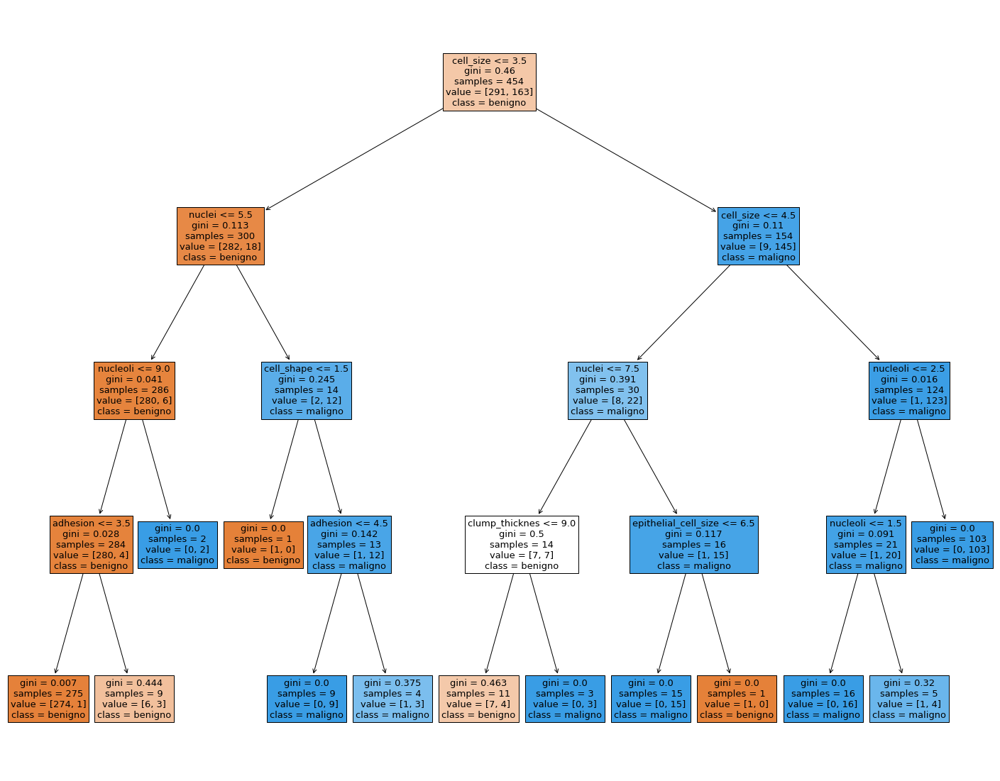

In [ ]:
from sklearn import tree
fig = plt.figure(figsize=(25,20))
tree.plot_tree(arbolBreastCancer1, feature_names = breast_cancer_df.columns, class_names = ['benigno', 'maligno'], filled=True, fontsize=13)

[Text(558.0, 679.5, 'cell_size <= 3.5\ngini = 0.46\nsamples = 454\nvalue = [291, 163]\nclass = benigno'),
 Text(279.0, 407.69999999999993, 'nuclei <= 5.5\ngini = 0.113\nsamples = 300\nvalue = [282, 18]\nclass = benigno'),
 Text(139.5, 135.89999999999998, 'gini = 0.041\nsamples = 286\nvalue = [280, 6]\nclass = benigno'),
 Text(418.5, 135.89999999999998, 'gini = 0.245\nsamples = 14\nvalue = [2, 12]\nclass = maligno'),
 Text(837.0, 407.69999999999993, 'cell_size <= 4.5\ngini = 0.11\nsamples = 154\nvalue = [9, 145]\nclass = maligno'),
 Text(697.5, 135.89999999999998, 'gini = 0.391\nsamples = 30\nvalue = [8, 22]\nclass = maligno'),
 Text(976.5, 135.89999999999998, 'gini = 0.016\nsamples = 124\nvalue = [1, 123]\nclass = maligno')]

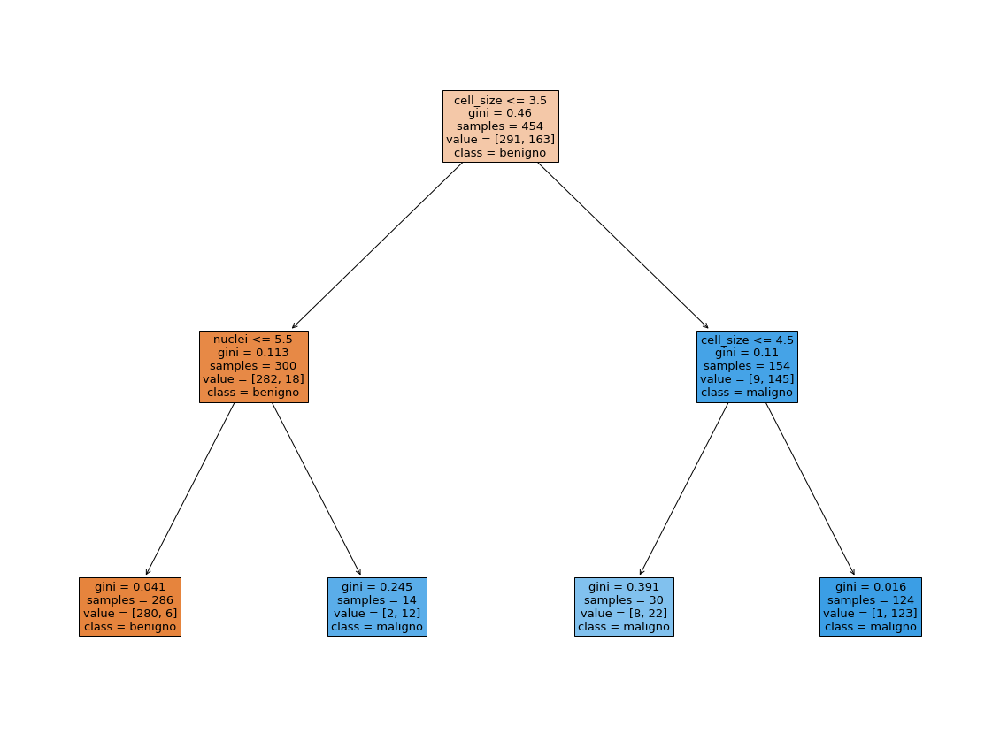

In [ ]:
from sklearn import tree
fig = plt.figure(figsize=(20,15))
tree.plot_tree(arbolBreastCancer2, feature_names = breast_cancer_df.columns, class_names = ['benigno', 'maligno'], filled=True, fontsize = 13)

### Ejercicio 8
Cual de los arboles es el mejor?
Imprima la matriz de confucion del mejor modelo

In [ ]:
print(calculate_accuracy(arbolBreastCancer1, X_test, Y_test))

0.9473684210526315


In [ ]:
print(calculate_accuracy(arbolBreastCancer2, X_test, Y_test))

0.9517543859649122


El segundo arbol parece tener mejor accuracy

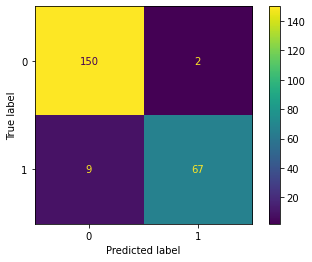

In [ ]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(arbolBreastCancer2, X_test, Y_test, values_format='')